In [4]:
import pandas as pd

In [5]:
import warnings
warnings.filterwarnings('ignore')

In [6]:
import matplotlib.pyplot as plt
import seaborn as sns

In [7]:
data=pd.read_csv("train.csv")

In [4]:
data.head(3)

,id,Age,Gender,Annual Income,Marital Status,Number of Dependents,Education Level,Occupation,Health Score,Location,...,Previous Claims,Vehicle Age,Credit Score,Insurance Duration,Policy Start Date,Customer Feedback,Smoking Status,Exercise Frequency,Property Type,Premium Amount
0,0,19.0,Female,10049.0,Married,1.0,Bachelor's,Self-Employed,22.598761,Urban,...,2.0,17.0,372.0,5.0,2023-12-23 15:21:39.134960,Poor,No,Weekly,House,2869.0
1,1,39.0,Female,31678.0,Divorced,3.0,Master's,NaN,15.569731,Rural,...,1.0,12.0,694.0,2.0,2023-06-12 15:21:39.111551,Average,Yes,Monthly,House,1483.0
2,2,23.0,Male,25602.0,Divorced,3.0,High School,Self-Employed,47.177549,Suburban,...,1.0,14.0,NaN,3.0,2023-09-30 15:21:39.221386,Good,Yes,Weekly,House,567.0


In [5]:
data.duplicated().sum()

0

No duplicated are present and now no need for the id in the model training as it does not provide any relevant changes in the result.


In [8]:
data.drop('id',axis=1,inplace=True)

In [7]:
data.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1200000 entries, 0 to 1199999
Data columns (total 20 columns):
 #   Column                Non-Null Count    Dtype  
---  ------                --------------    -----  
 0   Age                   1181295 non-null  float64
 1   Gender                1200000 non-null  object 
 2   Annual Income         1155051 non-null  float64
 3   Marital Status        1181471 non-null  object 
 4   Number of Dependents  1090328 non-null  float64
 5   Education Level       1200000 non-null  object 
 6   Occupation            841925 non-null   object 
 7   Health Score          1125924 non-null  float64
 8   Location              1200000 non-null  object 
 9   Policy Type           1200000 non-null  object 
 10  Previous Claims       835971 non-null   float64
 11  Vehicle Age           1199994 non-null  float64
 12  Credit Score          1062118 non-null  float64
 13  Insurance Duration    1199999 non-null  float64
 14  Policy Start Date     1200000 non-

There are 11 object types which we have to convert to foat or int to continue with model training and the total memory usage=888.6 MB.

In [8]:
data.isnull().sum()

Age                      18705
Gender                       0
Annual Income            44949
Marital Status           18529
Number of Dependents    109672
Education Level              0
Occupation              358075
Health Score             74076
Location                     0
Policy Type                  0
Previous Claims         364029
Vehicle Age                  6
Credit Score            137882
Insurance Duration           1
Policy Start Date            0
Customer Feedback        77824
Smoking Status               0
Exercise Frequency           0
Property Type                0
Premium Amount               0
dtype: int64

There are null values present in many independent features which should be removed or handled efficiently.

In [9]:
data.describe()

,Age,Annual Income,Number of Dependents,Health Score,Previous Claims,Vehicle Age,Credit Score,Insurance Duration,Premium Amount
count,1.181295e+06,1.155051e+06,1.090328e+06,1.125924e+06,835971.000000,1.199994e+06,1.062118e+06,1.199999e+06,1.200000e+06
mean,4.114556e+01,3.274522e+04,2.009934e+00,2.561391e+01,1.002689,9.569889e+00,5.929244e+02,5.018219e+00,1.102545e+03
std,1.353995e+01,3.217951e+04,1.417338e+00,1.220346e+01,0.982840,5.776189e+00,1.499819e+02,2.594331e+00,8.649989e+02
min,1.800000e+01,1.000000e+00,0.000000e+00,2.012237e+00,0.000000,0.000000e+00,3.000000e+02,1.000000e+00,2.000000e+01
25%,3.000000e+01,8.001000e+03,1.000000e+00,1.591896e+01,0.000000,5.000000e+00,4.680000e+02,3.000000e+00,5.140000e+02
50%,4.100000e+01,2.391100e+04,2.000000e+00,2.457865e+01,1.000000,1.000000e+01,5.950000e+02,5.000000e+00,8.720000e+02
75%,5.300000e+01,4.463400e+04,3.000000e+00,3.452721e+01,2.000000,1.500000e+01,7.210000e+02,7.000000e+00,1.509000e+03
max,6.400000e+01,1.499970e+05,4.000000e+00,5.897591e+01,9.000000,1.900000e+01,8.490000e+02,9.000000e+00,4.999000e+03


For age

In [10]:
with pd.option_context('display.float_format', '{:,.0f}'.format):
    print(data['Age'].describe())

count   1,181,295
mean           41
std            14
min            18
25%            30
50%            41
75%            53
max            64
Name: Age, dtype: float64


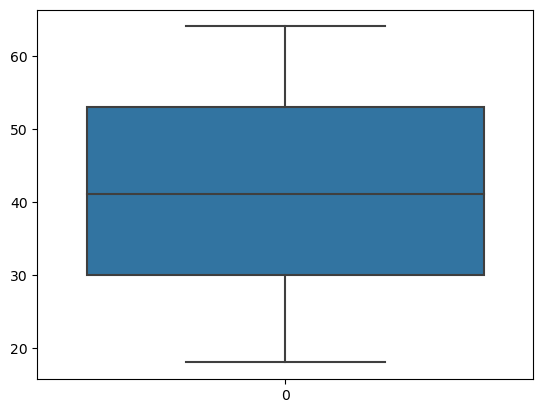

In [11]:
#lets see the box plot how data lies in age


sns.boxplot(data['Age'])
plt.show()

By boxplot and describe it is clear that no value is greater than 64 and not less than 18 so the insurance data mostly lies for the  service class and if in test any data goes beyond this range we will consider it as outliers.
By seeing the line of median is in middle we can infer it is a symmetric data.

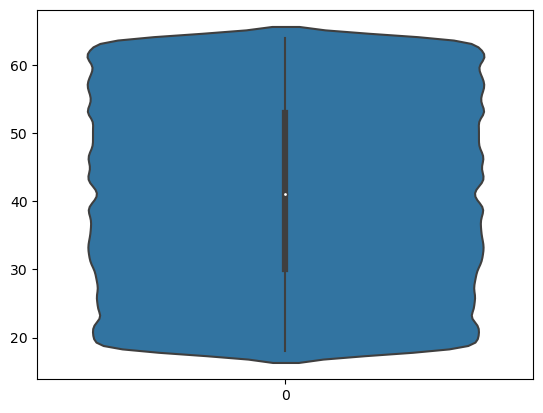

In [12]:
sns.violinplot(data['Age'])
plt.show()

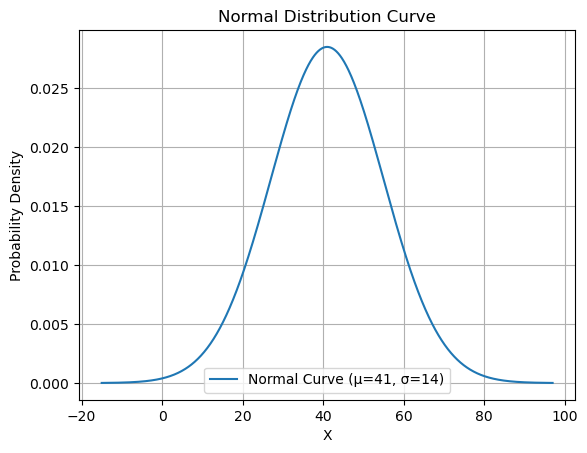

In [13]:
#for normal curve
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm

# Define mean (mu) and standard deviation (sigma)
mu, sigma = 41, 14

# Generate x values
x = np.linspace(mu - 4*sigma, mu + 4*sigma, 1000)

# Compute the PDF
y = norm.pdf(x, mu, sigma)

# Plot the normal curve
plt.plot(x, y, label=f'Normal Curve (μ={mu}, σ={sigma})')
plt.title("Normal Distribution Curve")
plt.xlabel("X")
plt.ylabel("Probability Density")
plt.legend()
plt.grid(True)
plt.show()


age data is normally distributed

In [9]:
data['Age']=data['Age'].fillna(data['Age'].median())

In [15]:
data['Age'].isnull().sum()

0

Null values are replace by median of the data which is 41

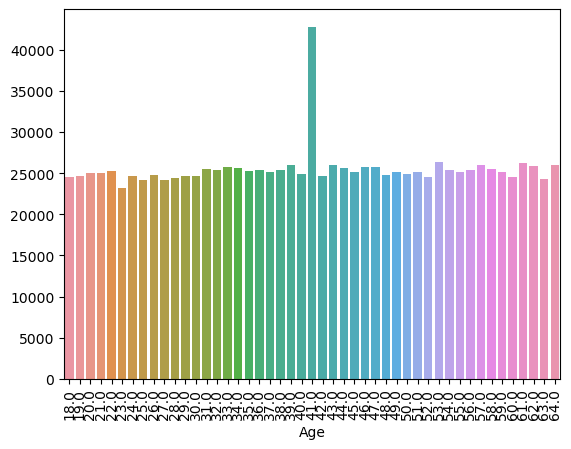

In [16]:
age_counts=data['Age'].value_counts()
sns.barplot(x=age_counts.index,y=age_counts.values)
plt.xticks(rotation=90)
plt.show()

majorly data lies at 41

In [17]:
data['Age'].corr(data['Premium Amount'])

-0.0024100069141385363

Age is negatively correlated but contribute less.

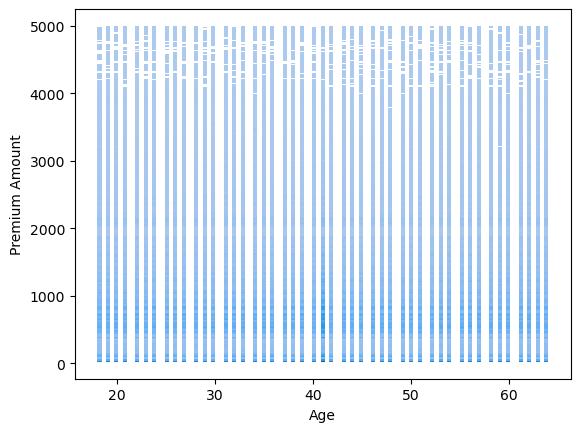

In [18]:
sns.histplot(x=data['Age'],y=data['Premium Amount'],kde=False)
plt.show()

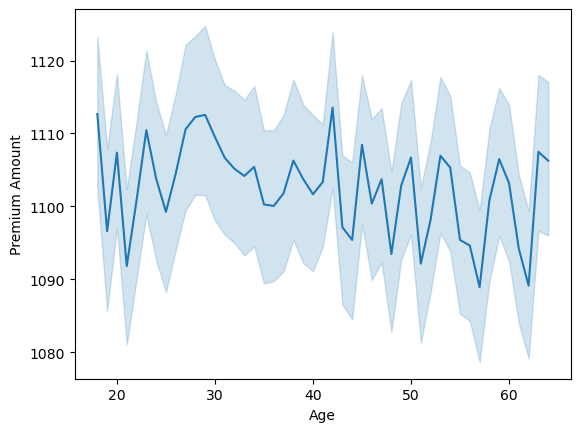

In [19]:
sns.lineplot(x=data['Age'],y=data['Premium Amount'])
plt.show()

In [20]:
data.head(1)

,Age,Gender,Annual Income,Marital Status,Number of Dependents,Education Level,Occupation,Health Score,Location,Policy Type,Previous Claims,Vehicle Age,Credit Score,Insurance Duration,Policy Start Date,Customer Feedback,Smoking Status,Exercise Frequency,Property Type,Premium Amount
0,19.0,Female,10049.0,Married,1.0,Bachelor's,Self-Employed,22.598761,Urban,Premium,2.0,17.0,372.0,5.0,2023-12-23 15:21:39.134960,Poor,No,Weekly,House,2869.0


For gender

In [21]:
data['Gender'].unique()

array(['Female', 'Male'], dtype=object)

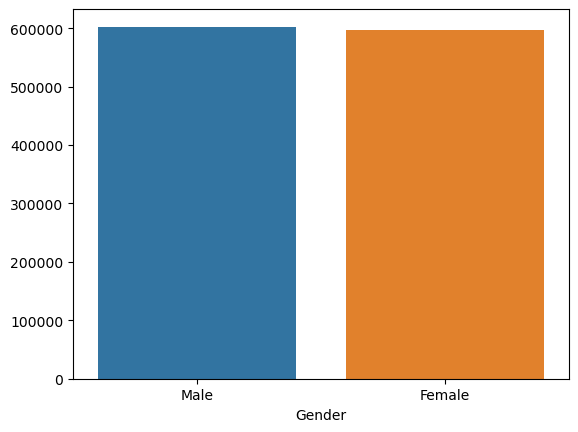

In [22]:
gender_counts=data ['Gender'].value_counts()
sns.barplot(x=gender_counts.index,y=gender_counts.values)
plt.show()

Approx both counts of male and female are same.

In [10]:
data['Gender']=data['Gender'].map({'Male':0,'Female':1})

In [24]:
data['Gender'].value_counts()

Gender
0    602571
1    597429
Name: count, dtype: int64

Mapping male with 0 and female with 1

In [25]:
data['Gender'].corr(data['Premium Amount'])

-0.000160982997272359

The gender independent feature is negatively correlated with dependent feature.

In [26]:
data.head(1)

,Age,Gender,Annual Income,Marital Status,Number of Dependents,Education Level,Occupation,Health Score,Location,Policy Type,Previous Claims,Vehicle Age,Credit Score,Insurance Duration,Policy Start Date,Customer Feedback,Smoking Status,Exercise Frequency,Property Type,Premium Amount
0,19.0,1,10049.0,Married,1.0,Bachelor's,Self-Employed,22.598761,Urban,Premium,2.0,17.0,372.0,5.0,2023-12-23 15:21:39.134960,Poor,No,Weekly,House,2869.0


For annual income

In [27]:
with pd.option_context('display.float_format', '{:,.0f}'.format):
    print(data['Annual Income'].describe())

count   1,155,051
mean       32,745
std        32,180
min             1
25%         8,001
50%        23,911
75%        44,634
max       149,997
Name: Annual Income, dtype: float64


In [11]:
#making it normalize
mini=data['Annual Income'].min()
maxi=data['Annual Income'].max()
def change_income(x):
    res=(x-mini)/(maxi-mini)
    return res
data['Annual Income']=data['Annual Income'].apply(change_income).values

In [12]:
data['Annual Income']=data['Annual Income'].fillna(data['Annual Income'].median())

In [30]:
data['Annual Income'].corr(data['Premium Amount'])

-0.009988935551280016

Negative correlated

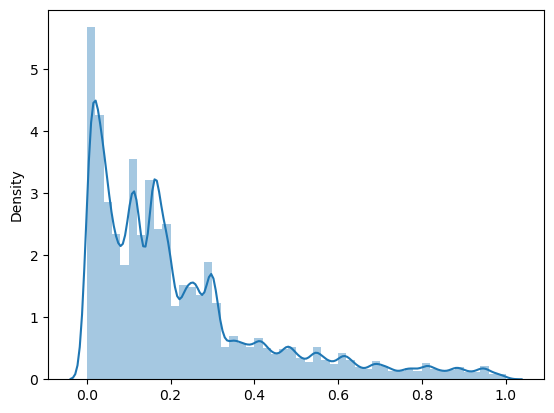

In [31]:
sns.distplot(x=data['Annual Income'])
plt.show()

In [32]:
data.head(1)

,Age,Gender,Annual Income,Marital Status,Number of Dependents,Education Level,Occupation,Health Score,Location,Policy Type,Previous Claims,Vehicle Age,Credit Score,Insurance Duration,Policy Start Date,Customer Feedback,Smoking Status,Exercise Frequency,Property Type,Premium Amount
0,19.0,1,0.066988,Married,1.0,Bachelor's,Self-Employed,22.598761,Urban,Premium,2.0,17.0,372.0,5.0,2023-12-23 15:21:39.134960,Poor,No,Weekly,House,2869.0


For maritial status

In [33]:
data['Marital Status'].unique()

array(['Married', 'Divorced', 'Single', nan], dtype=object)

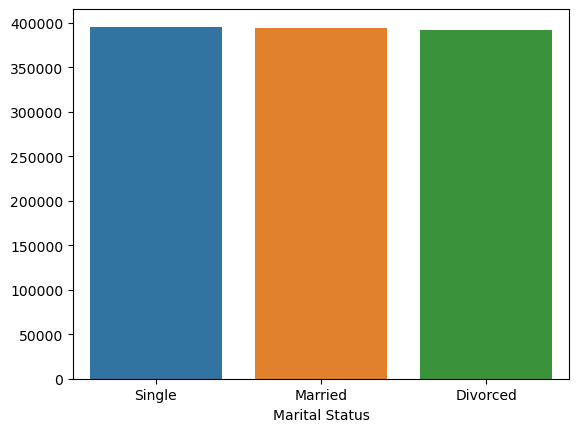

In [34]:
ms_counts=data['Marital Status'].value_counts()
sns.barplot(x=ms_counts.index,y=ms_counts.values)
plt.show()

In [13]:
data['Marital Status']=data['Marital Status'].fillna("Single")

In [36]:
data['Marital Status'].isnull().sum()

0

In [14]:
data['Marital Status']=data['Marital Status'].map({'Single':0,'Married':1,'Divorced':2}).values

In [38]:
data['Marital Status'].corr(data['Premium Amount'])

-0.003021206768128282

Negatively correlated

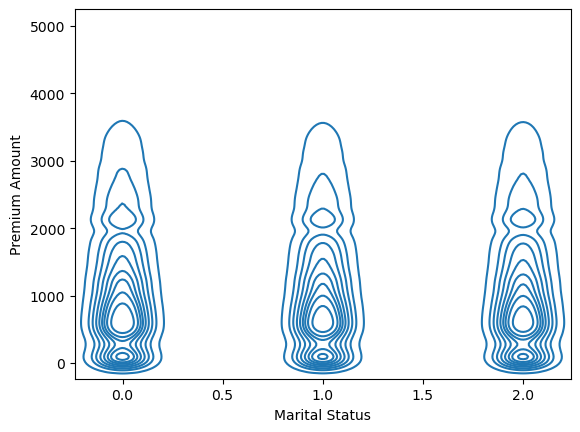

In [39]:
sns.kdeplot(x=data['Marital Status'],y=data['Premium Amount'])
plt.show()

In [40]:
data.head(1)

,Age,Gender,Annual Income,Marital Status,Number of Dependents,Education Level,Occupation,Health Score,Location,Policy Type,Previous Claims,Vehicle Age,Credit Score,Insurance Duration,Policy Start Date,Customer Feedback,Smoking Status,Exercise Frequency,Property Type,Premium Amount
0,19.0,1,0.066988,1,1.0,Bachelor's,Self-Employed,22.598761,Urban,Premium,2.0,17.0,372.0,5.0,2023-12-23 15:21:39.134960,Poor,No,Weekly,House,2869.0


For number of dependencies

In [41]:
data['Number of Dependents'].unique()

array([ 1.,  3.,  2.,  0.,  4., nan])

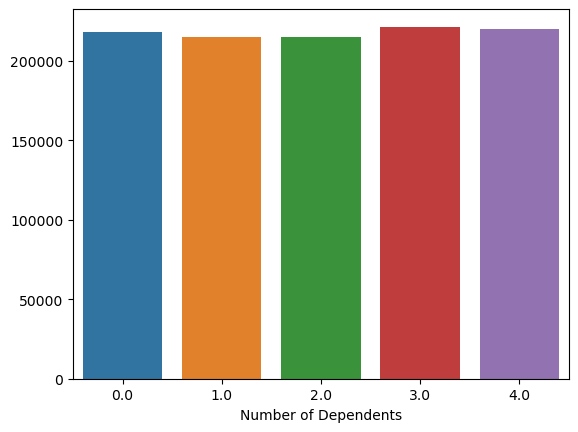

In [42]:
nd_counts=data['Number of Dependents'].value_counts()
sns.barplot(x=nd_counts.index,y=nd_counts.values)
plt.show()

As 3 s most frequent here  we can put in missing place but the null values with 3 can affect the result is somewhat different way so we can assign number of dependents as 0.0 assuming no dependents are there.

In [15]:
data['Number of Dependents']=data['Number of Dependents'].fillna(0.0)

In [44]:
data['Number of Dependents'].isnull().sum()

0

In [45]:
data['Number of Dependents'].corr(data['Premium Amount'])

-0.004305659848837527

Negatively correlated

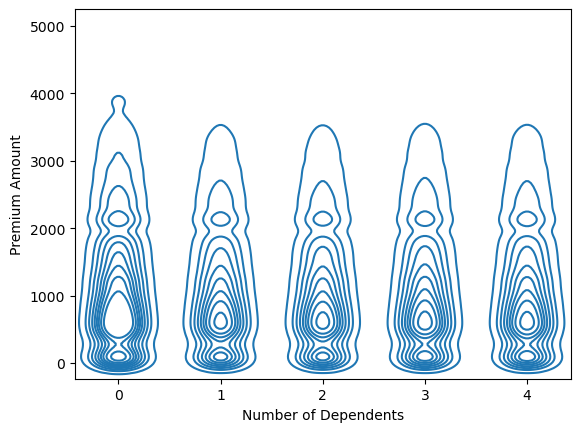

In [46]:
sns.kdeplot(x=data['Number of Dependents'],y=data['Premium Amount'])
plt.show()

In [47]:
data.head(1)

,Age,Gender,Annual Income,Marital Status,Number of Dependents,Education Level,Occupation,Health Score,Location,Policy Type,Previous Claims,Vehicle Age,Credit Score,Insurance Duration,Policy Start Date,Customer Feedback,Smoking Status,Exercise Frequency,Property Type,Premium Amount
0,19.0,1,0.066988,1,1.0,Bachelor's,Self-Employed,22.598761,Urban,Premium,2.0,17.0,372.0,5.0,2023-12-23 15:21:39.134960,Poor,No,Weekly,House,2869.0


For education level

In [48]:
data['Education Level'].unique()

array(["Bachelor's", "Master's", 'High School', 'PhD'], dtype=object)

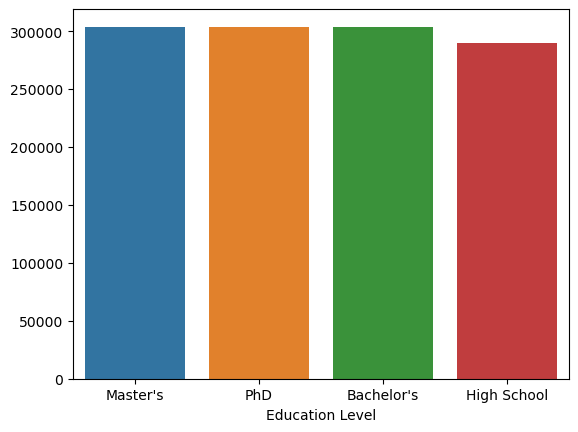

In [49]:
edu_counts=data['Education Level'].value_counts()
sns.barplot(x=edu_counts.index,y=edu_counts.values)
plt.show()

Majorly there are with masters degree

In [16]:
data['Education Level']=data['Education Level'].map({"Bachelor's":0,"Master's":1,"High School":2,"PhD":3}).values

In [51]:
data['Education Level'].corr(data['Premium Amount'])

-0.0004521513627917883

Negatively correlated

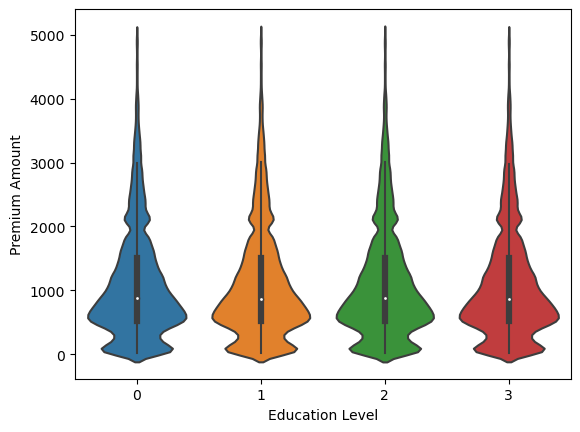

In [52]:
sns.violinplot(x=data['Education Level'],y=data['Premium Amount'])
plt.show()

In [53]:
data.head(1)

,Age,Gender,Annual Income,Marital Status,Number of Dependents,Education Level,Occupation,Health Score,Location,Policy Type,Previous Claims,Vehicle Age,Credit Score,Insurance Duration,Policy Start Date,Customer Feedback,Smoking Status,Exercise Frequency,Property Type,Premium Amount
0,19.0,1,0.066988,1,1.0,0,Self-Employed,22.598761,Urban,Premium,2.0,17.0,372.0,5.0,2023-12-23 15:21:39.134960,Poor,No,Weekly,House,2869.0


For occupation

In [54]:
data['Occupation'].unique()

array(['Self-Employed', nan, 'Employed', 'Unemployed'], dtype=object)

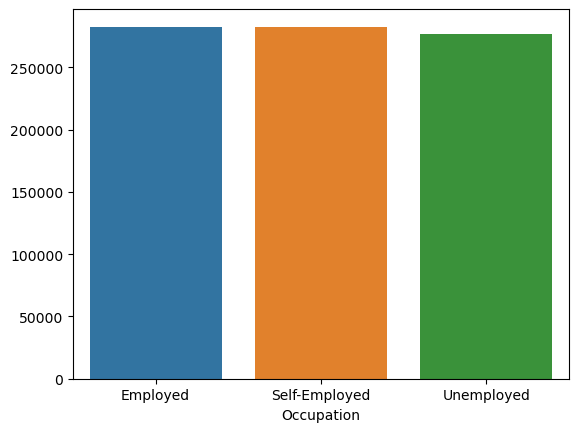

In [55]:
oc_counts=data['Occupation'].value_counts()
sns.barplot(x=oc_counts.index,y=oc_counts.values)
plt.show()

For occupation employed is most frequent but it is bad assumption to make employed for null values so we use unemployed

In [17]:
data['Occupation']=data['Occupation'].fillna("Unemployed")

In [18]:
data['Occupation']=data['Occupation'].map({"Self-Employed":0,'Employed':1,'Unemployed':2}).values

In [58]:
data['Occupation'].corr(data['Premium Amount'])

-0.00429358387480049

Negatively correlated

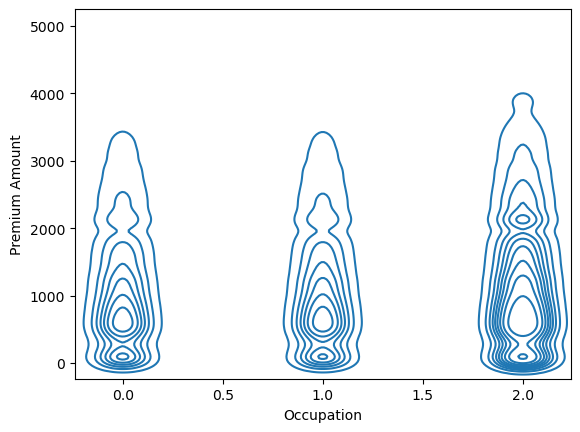

In [59]:
sns.kdeplot(x=data['Occupation'],y=data['Premium Amount'])
plt.show()

In [60]:
data.head(1)

,Age,Gender,Annual Income,Marital Status,Number of Dependents,Education Level,Occupation,Health Score,Location,Policy Type,Previous Claims,Vehicle Age,Credit Score,Insurance Duration,Policy Start Date,Customer Feedback,Smoking Status,Exercise Frequency,Property Type,Premium Amount
0,19.0,1,0.066988,1,1.0,0,0,22.598761,Urban,Premium,2.0,17.0,372.0,5.0,2023-12-23 15:21:39.134960,Poor,No,Weekly,House,2869.0


For health score

In [61]:
with pd.option_context('display.float_format', '{:,.0f}'.format):
    print(data['Health Score'].describe())

count   1,125,924
mean           26
std            12
min             2
25%            16
50%            25
75%            35
max            59
Name: Health Score, dtype: float64


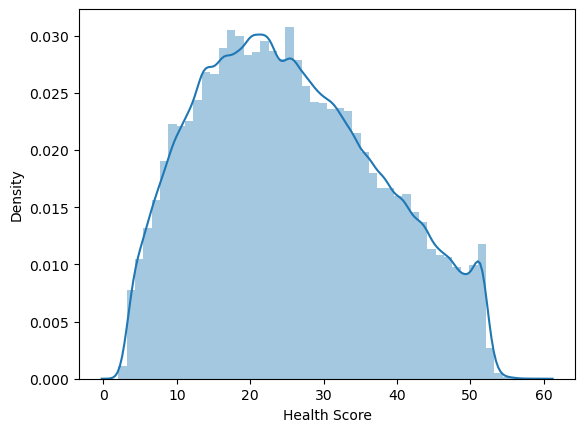

In [62]:

sns.distplot(data['Health Score'])
plt.show()

In [63]:
data['Health Score'].mode()

0    19.927241
Name: Health Score, dtype: float64

Median(50%)=25 so making the na values 25

In [19]:
data['Health Score']=data['Health Score'].fillna(data['Health Score'].median())

In [65]:
data['Health Score'].corr(data['Premium Amount'])

0.013976005825600976

Postively correlated

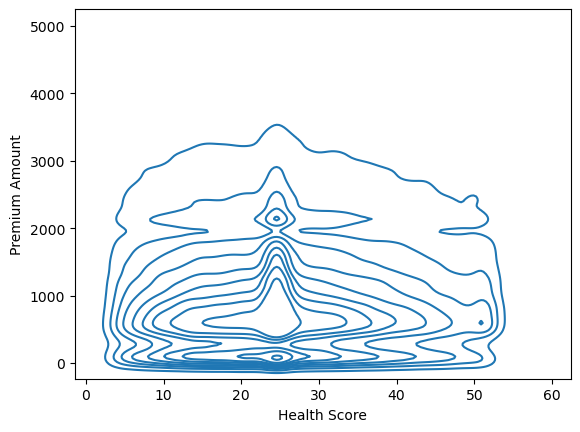

In [66]:
sns.kdeplot(x=data["Health Score"],y=data['Premium Amount'])
plt.show()

In [67]:
data.head(1)

,Age,Gender,Annual Income,Marital Status,Number of Dependents,Education Level,Occupation,Health Score,Location,Policy Type,Previous Claims,Vehicle Age,Credit Score,Insurance Duration,Policy Start Date,Customer Feedback,Smoking Status,Exercise Frequency,Property Type,Premium Amount
0,19.0,1,0.066988,1,1.0,0,0,22.598761,Urban,Premium,2.0,17.0,372.0,5.0,2023-12-23 15:21:39.134960,Poor,No,Weekly,House,2869.0


For location

In [68]:
data['Location'].unique()

array(['Urban', 'Rural', 'Suburban'], dtype=object)

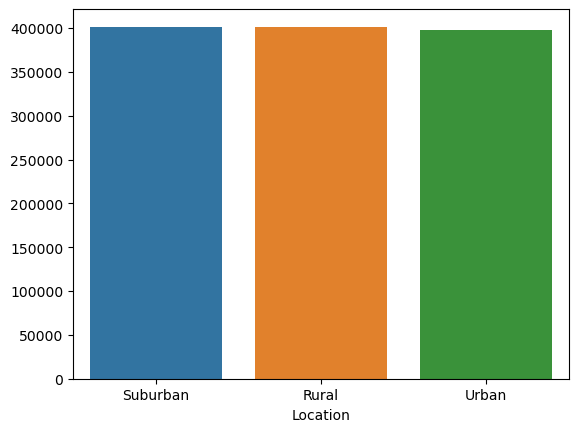

In [69]:
l_counts=data['Location'].value_counts()
sns.barplot(x=l_counts.index,y=l_counts.values)
plt.show()

suburban is the area where most resides

In [20]:
data['Location']=data['Location'].map({'Urban':0, 'Rural':1, 'Suburban':2})

In [71]:
data['Location'].corr(data['Premium Amount'])

-0.0005884020199541036

Negatively and weak correlated

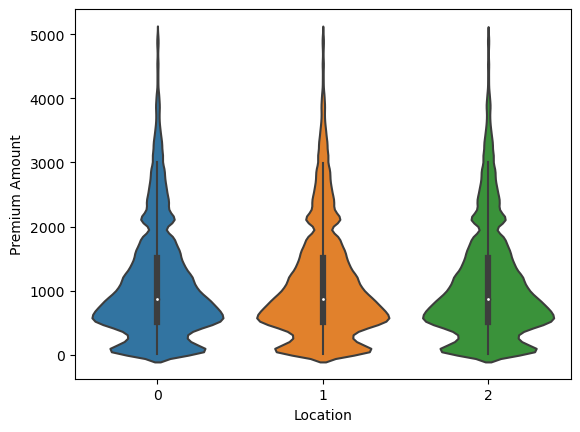

In [72]:
sns.violinplot(x=data['Location'],y=data['Premium Amount'])
plt.show()

In [73]:
data.head(1)

,Age,Gender,Annual Income,Marital Status,Number of Dependents,Education Level,Occupation,Health Score,Location,Policy Type,Previous Claims,Vehicle Age,Credit Score,Insurance Duration,Policy Start Date,Customer Feedback,Smoking Status,Exercise Frequency,Property Type,Premium Amount
0,19.0,1,0.066988,1,1.0,0,0,22.598761,0,Premium,2.0,17.0,372.0,5.0,2023-12-23 15:21:39.134960,Poor,No,Weekly,House,2869.0


For policy type

In [74]:
data['Policy Type'].unique()

array(['Premium', 'Comprehensive', 'Basic'], dtype=object)

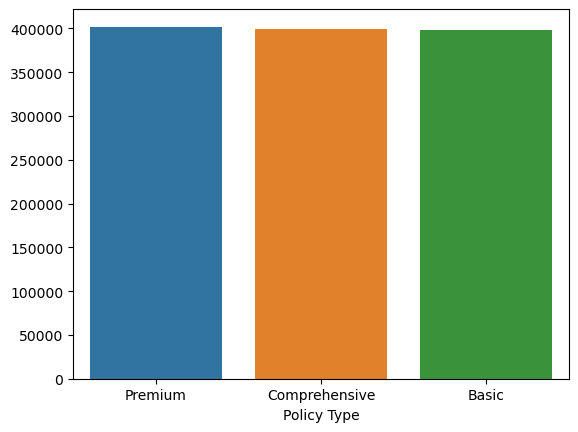

In [75]:
type_counts=data['Policy Type'].value_counts()
sns.barplot(x=type_counts.index,y=type_counts.values)
plt.show()

Premium type policy is more present

In [21]:
data['Policy Type']=data['Policy Type'].map({'Premium':0, 'Comprehensive':1, 'Basic':2})

In [77]:
data['Policy Type'].corr(data['Premium Amount'])

0.0008844164912577574

Positively but weak correlated

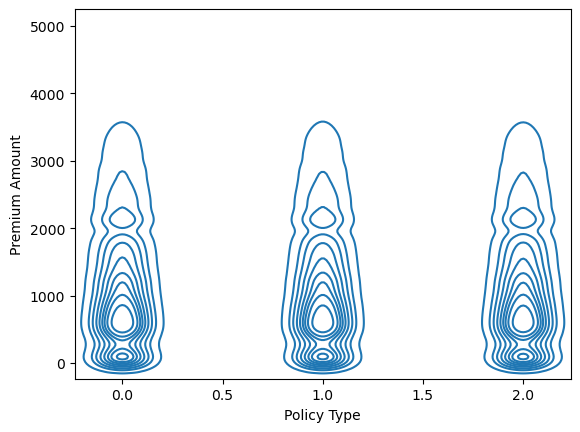

In [78]:
sns.kdeplot(x=data['Policy Type'],y=data['Premium Amount'])
plt.show()

In [79]:
data.head(1)

,Age,Gender,Annual Income,Marital Status,Number of Dependents,Education Level,Occupation,Health Score,Location,Policy Type,Previous Claims,Vehicle Age,Credit Score,Insurance Duration,Policy Start Date,Customer Feedback,Smoking Status,Exercise Frequency,Property Type,Premium Amount
0,19.0,1,0.066988,1,1.0,0,0,22.598761,0,0,2.0,17.0,372.0,5.0,2023-12-23 15:21:39.134960,Poor,No,Weekly,House,2869.0


For previous claims

In [80]:
data['Previous Claims'].unique()

array([ 2.,  1.,  0., nan,  3.,  4.,  5.,  6.,  7.,  8.,  9.])

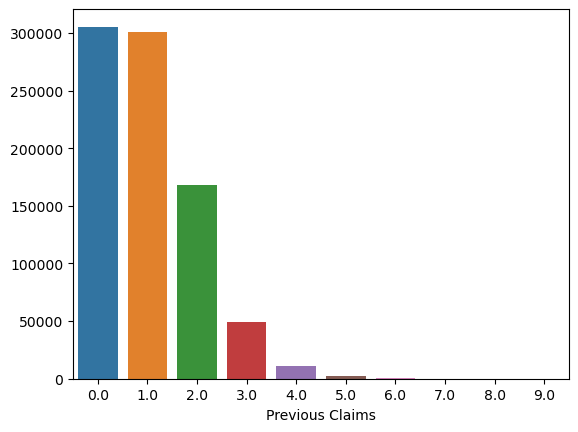

In [81]:
claims_conts=data['Previous Claims'].value_counts()
sns.barplot(x=claims_conts.index,y=claims_conts.values)
plt.show()

Previous no claims or 0.0 count is high

In [22]:
data['Previous Claims']=data['Previous Claims'].fillna(0.0)

In [83]:
data['Previous Claims'].corr(data['Premium Amount'])

0.04388466060150603

Positively related

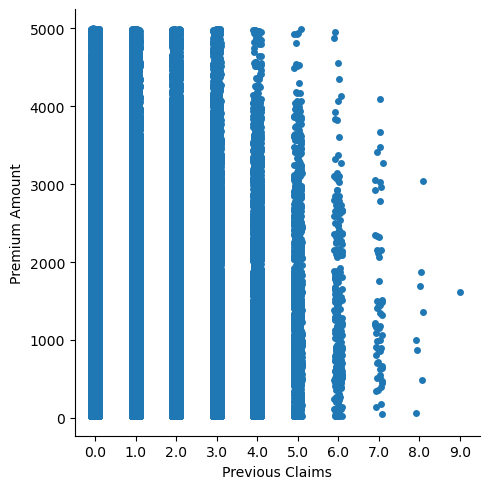

In [84]:
sns.catplot(x=data['Previous Claims'],y=data['Premium Amount'])
plt.show()

In [85]:
data.head(1)

,Age,Gender,Annual Income,Marital Status,Number of Dependents,Education Level,Occupation,Health Score,Location,Policy Type,Previous Claims,Vehicle Age,Credit Score,Insurance Duration,Policy Start Date,Customer Feedback,Smoking Status,Exercise Frequency,Property Type,Premium Amount
0,19.0,1,0.066988,1,1.0,0,0,22.598761,0,0,2.0,17.0,372.0,5.0,2023-12-23 15:21:39.134960,Poor,No,Weekly,House,2869.0


For vehicle age

In [86]:
data['Vehicle Age'].unique()

array([17., 12., 14.,  0.,  8.,  4., 11., 10.,  9.,  6., 19.,  3., 15.,
       16.,  5.,  7., 18.,  1.,  2., 13., nan])

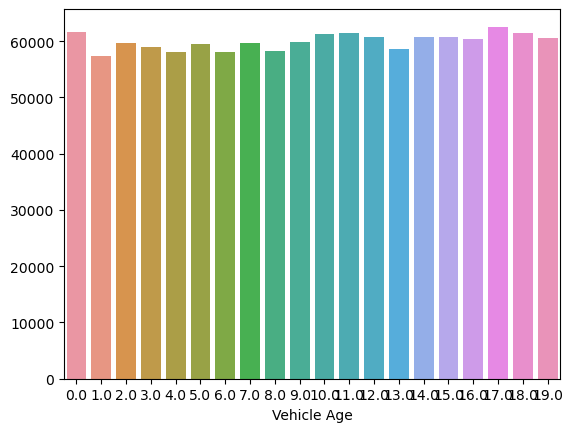

In [87]:
v_counts=data['Vehicle Age'].value_counts()
sns.barplot(x=v_counts.index,y=v_counts.values)
plt.show()

In [23]:
data['Vehicle Age']=data['Vehicle Age'].fillna(0.0)

In [89]:
data['Vehicle Age'].corr(data['Premium Amount'])

0.00039003889019071763

Positive correlated

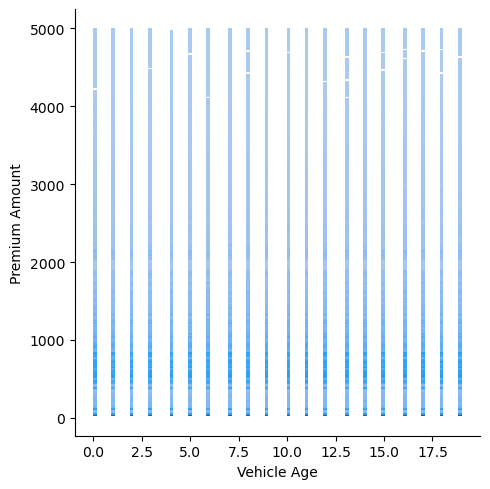

In [90]:
sns.displot(x=data['Vehicle Age'],y=data['Premium Amount'])
plt.show()

In [91]:
data.head(1)

,Age,Gender,Annual Income,Marital Status,Number of Dependents,Education Level,Occupation,Health Score,Location,Policy Type,Previous Claims,Vehicle Age,Credit Score,Insurance Duration,Policy Start Date,Customer Feedback,Smoking Status,Exercise Frequency,Property Type,Premium Amount
0,19.0,1,0.066988,1,1.0,0,0,22.598761,0,0,2.0,17.0,372.0,5.0,2023-12-23 15:21:39.134960,Poor,No,Weekly,House,2869.0


For credit score

In [92]:
with pd.option_context('display.float_format', '{:,.0f}'.format):
    print(data['Credit Score'].describe())

count   1,062,118
mean          593
std           150
min           300
25%           468
50%           595
75%           721
max           849
Name: Credit Score, dtype: float64


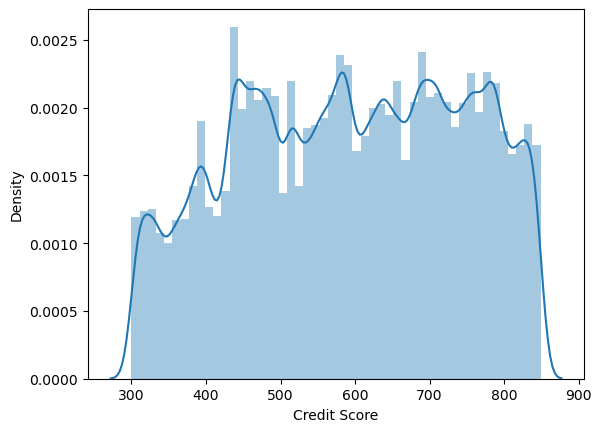

In [93]:
sns.distplot(data['Credit Score'])
plt.show()

In [94]:
data['Credit Score'].isnull().sum()

137882

In [24]:
data['Credit Score'].fillna(data['Credit Score'].median(),inplace=True)

In [103]:
data['Credit Score'].corr(data['Premium Amount'])

-0.024471215832838074

Negatively correlated

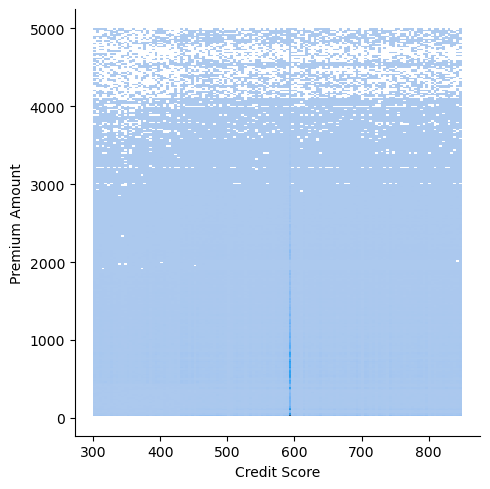

In [102]:
sns.displot(x=data['Credit Score'],y=data['Premium Amount'])
plt.show()

In [104]:
data.head(1)

,Age,Gender,Annual Income,Marital Status,Number of Dependents,Education Level,Occupation,Health Score,Location,Policy Type,Previous Claims,Vehicle Age,Credit Score,Insurance Duration,Policy Start Date,Customer Feedback,Smoking Status,Exercise Frequency,Property Type,Premium Amount
0,19.0,1,0.066988,1,1.0,0,0,22.598761,0,0,2.0,17.0,372.0,5.0,2023-12-23 15:21:39.134960,Poor,No,Weekly,House,2869.0


For insurance duration

In [105]:
data['Insurance Duration'].unique()

array([ 5.,  2.,  3.,  1.,  4.,  6.,  8.,  9.,  7., nan])

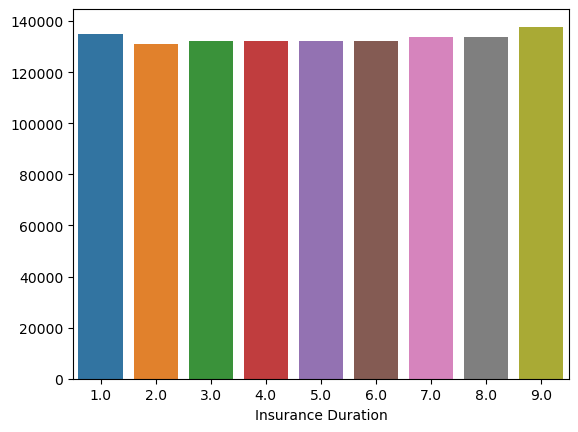

In [111]:
d_counts=data['Insurance Duration'].value_counts()
sns.barplot(x=d_counts.index,y=d_counts.values)
plt.show()

9.0 is most favuorable duaration

In [114]:
data['Insurance Duration'].isnull().sum()

0

In [25]:
data['Insurance Duration'].fillna(9.0,inplace=True)

In [116]:
data['Insurance Duration'].corr(data['Premium Amount'])

-2.827631392331604e-05

Negatively weak correlated

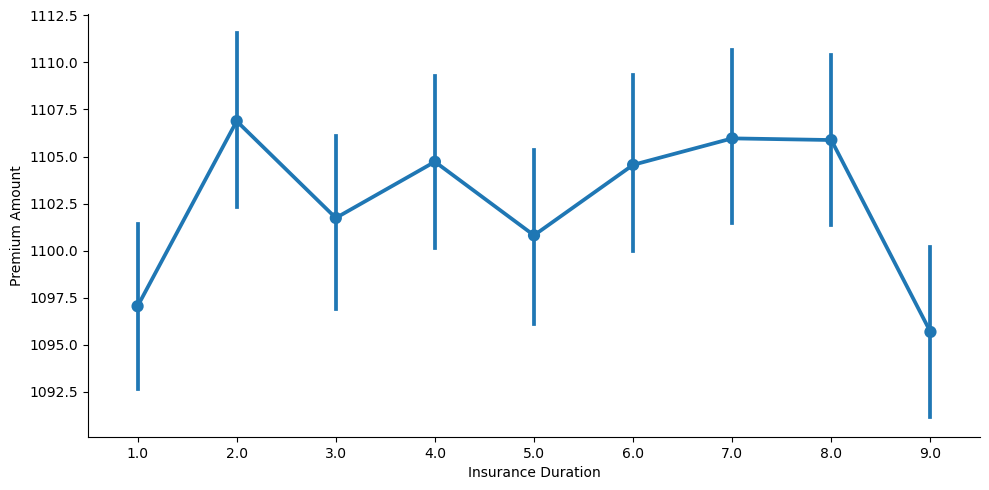

In [122]:
sns.catplot(x='Insurance Duration',y='Premium Amount',data=data,kind='point',aspect=2)
plt.show()

In [123]:
data.head(1)

,Age,Gender,Annual Income,Marital Status,Number of Dependents,Education Level,Occupation,Health Score,Location,Policy Type,Previous Claims,Vehicle Age,Credit Score,Insurance Duration,Policy Start Date,Customer Feedback,Smoking Status,Exercise Frequency,Property Type,Premium Amount
0,19.0,1,0.066988,1,1.0,0,0,22.598761,0,0,2.0,17.0,372.0,5.0,2023-12-23 15:21:39.134960,Poor,No,Weekly,House,2869.0


For policy start date

In [24]:
data['Policy Start Date'].dtype

dtype('O')

In [26]:
data['Policy Start Date']=pd.to_datetime(data['Policy Start Date'])

In [27]:
data['Policy Start Date'].dtype

dtype('<M8[ns]')

In [28]:
data['Policy Start Date'].max()

Timestamp('2024-08-15 15:21:39.287115')

In [29]:
data['Policy Start Date'].min()

Timestamp('2019-08-17 15:21:39.080371')

Converting into count of the number of years from the date '2024-08-16 0:0:0' according to the data max timestamp

In [30]:
from datetime import datetime
target_date = datetime(2024, 8, 16, 0, 0, 0)


In [31]:
# Calculate the difference in days
data['difference_days'] = (target_date - data['Policy Start Date']).dt.days

# Convert days to years (approximate, considering 365.25 days per year for leap years)
data['difference_years'] = data['difference_days'] / 365.25

# Optionally round the result for display
data['difference_years'] = data['difference_years'].round(2)


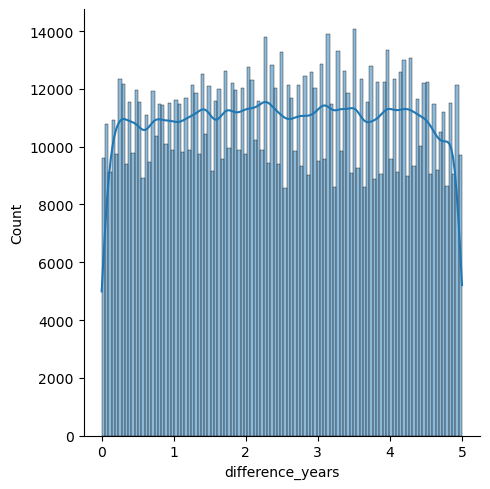

In [159]:

sns.displot(data['difference_years'],kde=True)
plt.show()

In [160]:
data.head(1)

,Age,Gender,Annual Income,Marital Status,Number of Dependents,Education Level,Occupation,Health Score,Location,Policy Type,...,Credit Score,Insurance Duration,Policy Start Date,Customer Feedback,Smoking Status,Exercise Frequency,Property Type,Premium Amount,difference_days,difference_years
0,19.0,1,0.066988,1,1.0,0,0,22.598761,0,0,...,372.0,5.0,2023-12-23 15:21:39.134960,Poor,No,Weekly,House,2869.0,236,0.65


In [32]:
data.drop(['difference_days','Policy Start Date'],axis=1,inplace=True)

In [33]:
data.head(1)

,Age,Gender,Annual Income,Marital Status,Number of Dependents,Education Level,Occupation,Health Score,Location,Policy Type,Previous Claims,Vehicle Age,Credit Score,Insurance Duration,Customer Feedback,Smoking Status,Exercise Frequency,Property Type,Premium Amount,difference_years
0,19.0,1,0.066988,1,1.0,0,0,22.598761,0,0,2.0,17.0,372.0,5.0,Poor,No,Weekly,House,2869.0,0.65


In [163]:
data['difference_years'].corr(data['Premium Amount'])

0.010110003844164463

Positively and strong correlated

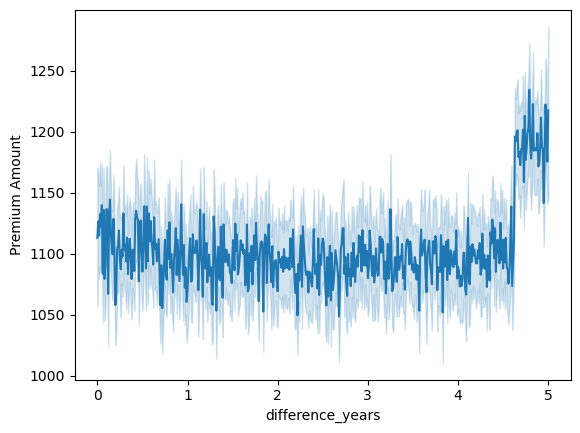

In [164]:
sns.lineplot(x=data['difference_years'],y=data['Premium Amount'])
plt.show()

In [32]:
data.head(1)


,Age,Gender,Annual Income,Marital Status,Number of Dependents,Education Level,Occupation,Health Score,Location,Policy Type,Previous Claims,Vehicle Age,Credit Score,Insurance Duration,Customer Feedback,Smoking Status,Exercise Frequency,Property Type,Premium Amount,difference_years
0,19.0,1,0.066988,1,1.0,0,0,22.598761,0,0,2.0,17.0,372.0,5.0,Poor,No,Weekly,House,2869.0,0.65


For customer feedback

In [174]:
data['Customer Feedback'].unique()

array(['Poor', 'Average', 'Good'], dtype=object)

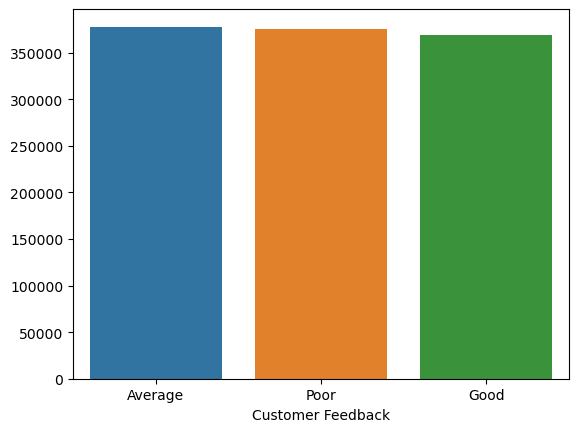

In [170]:
feed_counts=data['Customer Feedback'].value_counts()
sns.barplot(x=feed_counts.index,y=feed_counts.values)
plt.show()

Average is most favuorable

In [171]:
data['Customer Feedback'].isnull().sum()

77824

In [34]:
data['Customer Feedback']=data['Customer Feedback'].fillna('Average')

In [35]:
data['Customer Feedback']=data['Customer Feedback'].map({'Poor':0, 'Average':1, 'Good':2}).values

In [179]:
data['Customer Feedback'].corr(data['Premium Amount'])

-0.0011464530041483162

Negatively correlated

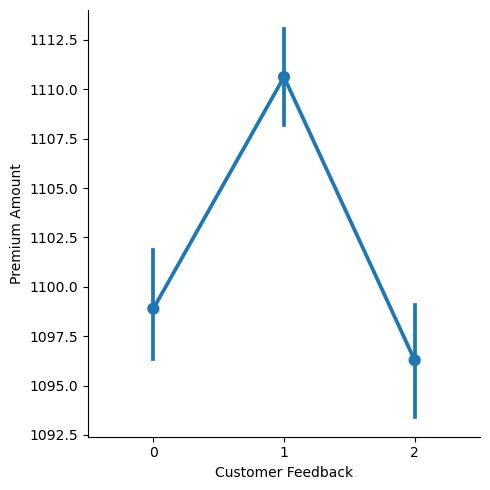

In [182]:
sns.catplot(x='Customer Feedback',y='Premium Amount',data=data,kind='point')

In [183]:
data.head(1)

,Age,Gender,Annual Income,Marital Status,Number of Dependents,Education Level,Occupation,Health Score,Location,Policy Type,Previous Claims,Vehicle Age,Credit Score,Insurance Duration,Customer Feedback,Smoking Status,Exercise Frequency,Property Type,Premium Amount,difference_years
0,19.0,1,0.066988,1,1.0,0,0,22.598761,0,0,2.0,17.0,372.0,5.0,0,No,Weekly,House,2869.0,0.65


For smoking status

In [184]:
data['Smoking Status'].unique()

array(['No', 'Yes'], dtype=object)

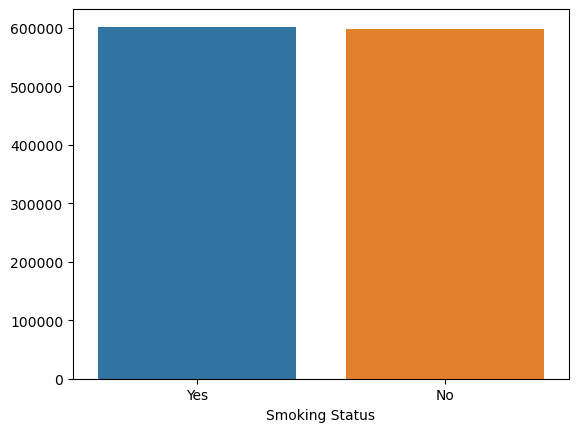

In [186]:
smoke_counts=data['Smoking Status'].value_counts()
sns.barplot(x=smoke_counts.index,y=smoke_counts.values)
plt.show()

In [36]:
data['Smoking Status']=data['Smoking Status'].map({'No':0, 'Yes':1}).values

In [190]:
data['Smoking Status'].corr(data['Premium Amount'])

0.00016274587129143112

Positive weak correlated

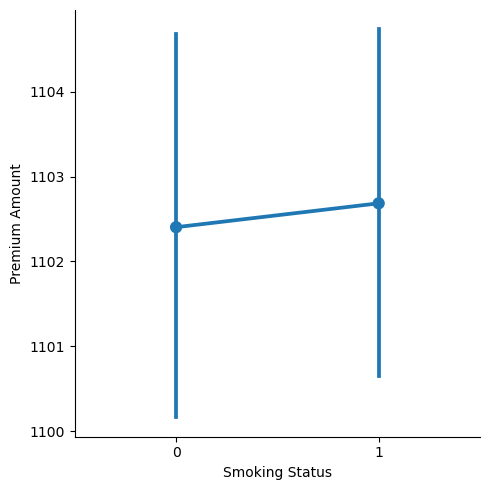

In [191]:
sns.catplot(x='Smoking Status',y='Premium Amount',data=data, kind='point')
plt.show()

In [192]:
data.head(1)

,Age,Gender,Annual Income,Marital Status,Number of Dependents,Education Level,Occupation,Health Score,Location,Policy Type,Previous Claims,Vehicle Age,Credit Score,Insurance Duration,Customer Feedback,Smoking Status,Exercise Frequency,Property Type,Premium Amount,difference_years
0,19.0,1,0.066988,1,1.0,0,0,22.598761,0,0,2.0,17.0,372.0,5.0,0,0,Weekly,House,2869.0,0.65


For exercise frequency

In [193]:
data['Exercise Frequency'].unique()

array(['Weekly', 'Monthly', 'Daily', 'Rarely'], dtype=object)

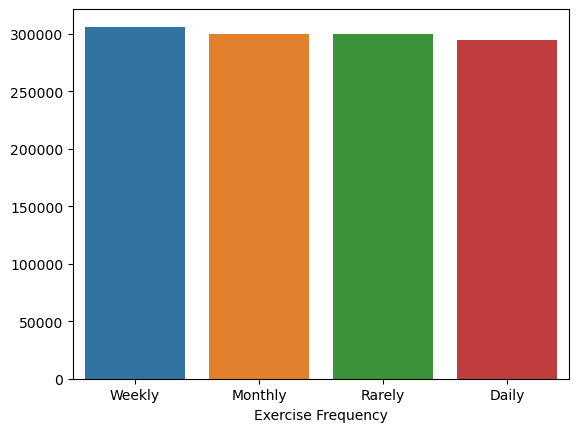

In [195]:
exer_counts=data['Exercise Frequency'].value_counts()
sns.barplot(x=exer_counts.index,y=exer_counts.values)
plt.show()

In [37]:
data['Exercise Frequency']=data['Exercise Frequency'].map({'Weekly':0, 'Monthly':1, 'Daily':2, 'Rarely':3}).values

In [198]:
data['Exercise Frequency'].corr(data['Premium Amount'])

0.0004784561305815654

Positively and weak correlated

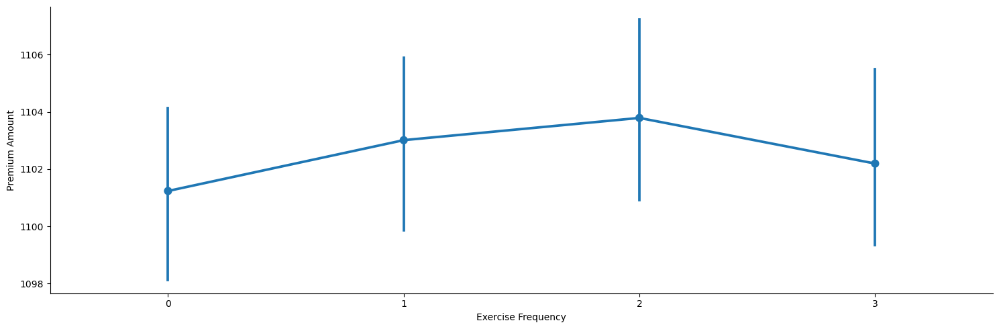

In [200]:
sns.catplot(x='Exercise Frequency',y='Premium Amount',data=data,kind='point',aspect=3)
plt.show()

In [201]:
data.head(1)

,Age,Gender,Annual Income,Marital Status,Number of Dependents,Education Level,Occupation,Health Score,Location,Policy Type,Previous Claims,Vehicle Age,Credit Score,Insurance Duration,Customer Feedback,Smoking Status,Exercise Frequency,Property Type,Premium Amount,difference_years
0,19.0,1,0.066988,1,1.0,0,0,22.598761,0,0,2.0,17.0,372.0,5.0,0,0,0,House,2869.0,0.65


For property type

In [202]:
data['Property Type'].unique()

array(['House', 'Apartment', 'Condo'], dtype=object)

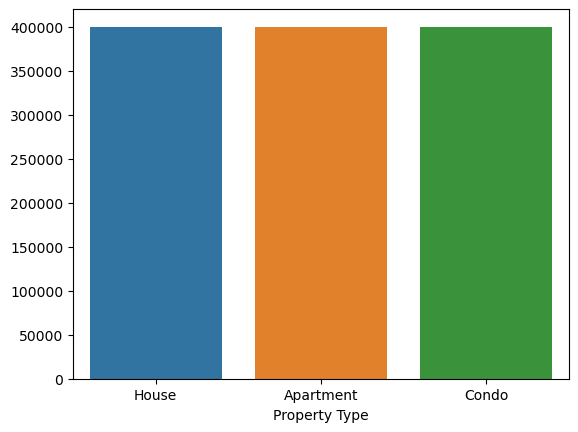

In [204]:
prop_counts=data['Property Type'].value_counts()
sns.barplot(x=prop_counts.index,y=prop_counts.values)
plt.show()

In [38]:
data['Property Type']=data['Property Type'].map({'House':0, 'Apartment':1, 'Condo':2}).values

In [207]:
data['Property Type'].corr(data['Premium Amount'])

0.00017099655788486903

Positively and weakly correlated

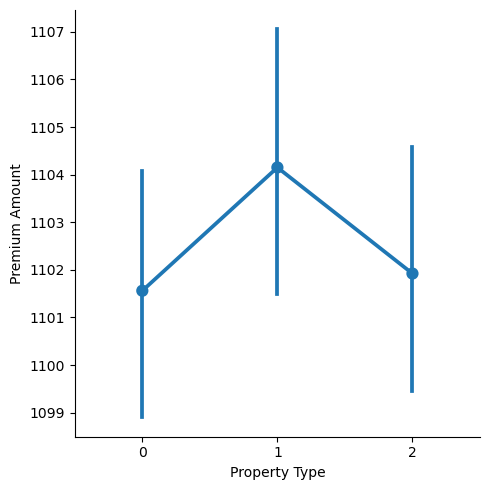

In [208]:
sns.catplot(x='Property Type',y='Premium Amount',data=data,kind='point',aspect=3)
plt.show()

In [248]:
data.head(1)

,Age,Gender,Annual Income,Marital Status,Number of Dependents,Education Level,Occupation,Health Score,Location,Policy Type,Previous Claims,Vehicle Age,Credit Score,Insurance Duration,Customer Feedback,Smoking Status,Exercise Frequency,Property Type,Premium Amount,difference_years
0,19.0,1,0.066988,1,1.0,0,0,22.598761,0,0,2.0,17.0,372.0,5.0,0,0,0,0,2869.0,0.65


Now all data is clean and ready to be used for more analysis.

In [41]:
sns.pairplot(data,height=4, aspect=1.5)
plt.show()

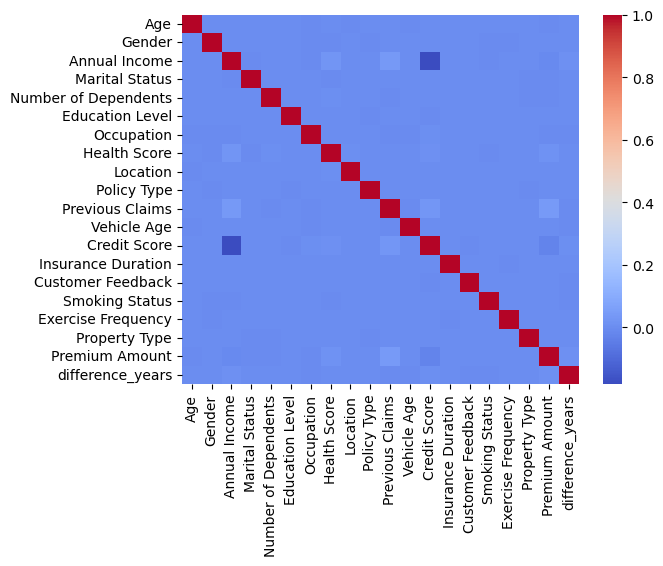

In [39]:
sns.heatmap(data.corr(), cmap='coolwarm', fmt=".2f", cbar=True)
plt.show()

In [43]:
#highly negatively correlated
data['Credit Score'].corr(data['Annual Income'])

-0.18117993369621346

Saving cleaned file for further analysis at data virtualization tools

In [53]:
data.to_csv('cleaned_data.csv',index=False)

In [55]:
data=pd.read_csv("cleaned_data.csv")

In [58]:
data.head(2)

,Age,Gender,Annual Income,Marital Status,Number of Dependents,Education Level,Occupation,Health Score,Location,Policy Type,Previous Claims,Vehicle Age,Credit Score,Insurance Duration,Customer Feedback,Smoking Status,Exercise Frequency,Property Type,Premium Amount,difference_years
0,19.0,1,0.066988,1,1.0,0,0,22.598761,0,0,2.0,17.0,372.0,5.0,0,0,0,0,2869.0,0.65
1,39.0,1,0.211186,2,3.0,1,2,15.569731,1,1,1.0,12.0,694.0,2.0,1,1,1,0,1483.0,1.18


In [57]:
data.drop('Unnamed: 0',axis=1,inplace=True)

In [59]:
y=data['Premium Amount']

In [60]:
x=data.drop('Premium Amount',axis=1)

In [61]:
data.shape

(1200000, 20)

In [62]:
x.shape

(1200000, 19)

Now splitting into train, test and validation set

In [63]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.4,random_state=42)

In [64]:
x_train.shape

(720000, 19)

In [65]:
x_test.shape

(480000, 19)

Now makig validation set from test

In [66]:
x_test,x_val,y_test,y_val=train_test_split(x_test,y_test,test_size=0.5,random_state=42)

In [67]:
x_val.shape

(240000, 19)

Now fitting the regression problem to thew models.

In [68]:
from sklearn.metrics import mean_absolute_error,r2_score,mean_absolute_percentage_error

In [69]:
def check(model):
    y_pred=model.predict(x_val)
    print("The mean _absolute error: ",mean_absolute_error(y_val,y_pred))
    print("The r2 score: ",r2_score(y_val,y_pred))
    print("The accuracy: ", 100-mean_absolute_percentage_error(y_val,y_pred))

In [63]:
from sklearn.linear_model import LinearRegression
check(LinearRegression().fit(x_train,y_train))

The mean _absolute error:  666.4479614954748
The r2 score:  0.002977351338205758
The accuracy:  96.9919564150155


In [68]:
from sklearn.neighbors import KNeighborsRegressor 
for i in range(1,10):
    print("The accuracy when k =",i)
    check(KNeighborsRegressor(i).fit(x_train,y_train))

The accuracy when k = 1
The mean _absolute error:  911.9217
The r2 score:  -0.9742027956908128
The accuracy:  96.74713256297218
The accuracy when k = 2
The mean _absolute error:  805.7121666666667
The r2 score:  -0.49169752175677406
The accuracy:  96.85839594276386
The accuracy when k = 3
The mean _absolute error:  763.3427083333333
The r2 score:  -0.3264097792294016
The accuracy:  96.91098283139985
The accuracy when k = 4
The mean _absolute error:  740.344546875
The r2 score:  -0.2444960131096976
The accuracy:  96.9334123090485
The accuracy when k = 5
The mean _absolute error:  725.4501850000001
The r2 score:  -0.19403447904089566
The accuracy:  96.95395456417768
The accuracy when k = 6
The mean _absolute error:  715.3858013888889
The r2 score:  -0.16013873700102388
The accuracy:  96.96484096968244
The accuracy when k = 7
The mean _absolute error:  708.6446910714286
The r2 score:  -0.13755807026307454
The accuracy:  96.96809492954145
The accuracy when k = 8
The mean _absolute error:  

Selecting k=10

In [69]:
from sklearn.tree import DecisionTreeRegressor
check(DecisionTreeRegressor().fit(x_train,y_train))

The mean _absolute error:  898.8055416666666
The r2 score:  -1.0519550180514514
The accuracy:  96.56276524971139


In [70]:
from sklearn.ensemble import AdaBoostRegressor
check(AdaBoostRegressor().fit(x_train,y_train))

The mean _absolute error:  768.193236328184
The r2 score:  -0.1254404488359433
The accuracy:  95.97619075637449


In [71]:
from sklearn.ensemble import BaggingRegressor
check(BaggingRegressor().fit(x_train,y_train))

The mean _absolute error:  681.05000125
The r2 score:  -0.06927409644930838
The accuracy:  96.81126164211943


In [72]:
from sklearn.ensemble import ExtraTreesRegressor
check(ExtraTreesRegressor().fit(x_train,y_train))

The mean _absolute error:  662.1109971249999
The r2 score:  0.02105568163094307
The accuracy:  96.80031358208416


In [73]:
from sklearn.ensemble import GradientBoostingRegressor
check(GradientBoostingRegressor().fit(x_train,y_train))

The mean _absolute error:  655.2910225396101
The r2 score:  0.027606233920753342
The accuracy:  96.99189129574438


In [70]:
from sklearn.ensemble import HistGradientBoostingRegressor
check(HistGradientBoostingRegressor().fit(x_train,y_train))

The mean _absolute error:  640.1894857478721
The r2 score:  0.04908760414784974
The accuracy:  97.004572825575


In [75]:
from sklearn.ensemble import RandomForestRegressor
check(RandomForestRegressor().fit(x_train,y_train))

The mean _absolute error:  654.6103024583332
The r2 score:  0.025795558581453548
The accuracy:  96.84000511046398


In [80]:
from xgboost import XGBRegressor
check(XGBRegressor().fit(x_train,y_train))

The mean _absolute error:  641.3956284092744
The r2 score:  0.04366661924096582
The accuracy:  96.99502014660739


In [71]:
from lightgbm import LGBMRegressor
check(LGBMRegressor().fit(x_train,y_train))

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.034885 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1132
[LightGBM] [Info] Number of data points in the train set: 720000, number of used features: 19
[LightGBM] [Info] Start training from score 1102.863665
The mean _absolute error:  639.9986018674065
The r2 score:  0.049325299658794286
The accuracy:  97.0008296068744


In [84]:
from catboost import CatBoostRegressor
check(CatBoostRegressor().fit(x_train,y_train))

Learning rate set to 0.115781
0:	learn: 863.2329030	total: 277ms	remaining: 4m 36s
1:	learn: 861.2878727	total: 359ms	remaining: 2m 59s
2:	learn: 859.7461700	total: 426ms	remaining: 2m 21s
3:	learn: 858.5801970	total: 474ms	remaining: 1m 58s
4:	learn: 857.5867739	total: 515ms	remaining: 1m 42s
5:	learn: 856.8181193	total: 554ms	remaining: 1m 31s
6:	learn: 856.1973545	total: 592ms	remaining: 1m 23s
7:	learn: 855.6672295	total: 633ms	remaining: 1m 18s
8:	learn: 854.7289541	total: 671ms	remaining: 1m 13s
9:	learn: 854.3680527	total: 711ms	remaining: 1m 10s
10:	learn: 854.1325035	total: 750ms	remaining: 1m 7s
11:	learn: 853.8743484	total: 788ms	remaining: 1m 4s
12:	learn: 853.6074844	total: 826ms	remaining: 1m 2s
13:	learn: 853.4303055	total: 863ms	remaining: 1m
14:	learn: 853.3053794	total: 898ms	remaining: 59s
15:	learn: 853.2376789	total: 934ms	remaining: 57.4s
16:	learn: 853.1703609	total: 978ms	remaining: 56.5s
17:	learn: 853.0278856	total: 1.02s	remaining: 55.9s
18:	learn: 852.804840

In [72]:
from sklearn.neural_network import MLPRegressor
check(MLPRegressor().fit(x_train,y_train))

The mean _absolute error:  662.4735576753397
The r2 score:  0.01062237859570947
The accuracy:  96.98326685328676


The accuracy of the models are:
Linear Regression = 96.9919564150155,
KNN = 96.97539079094197,
Decision Tree = 96.56276524971139,
Ada Boost = 95.97619075637449
Bagging = 96.81126164211943
Extra tree = 96.80031358208416
Gradient Boosting = 96.99189129574438,
HistGradient = 97.00166170184093,
Random Forest = 96.84000511046398,
XGBoost = 96.99502014660739,
LGBM = 97.00082979034096,
CAtBoost = 96.99668308576976,
Multi layer perceptron =  97.06139596145353

Top 3 models are MLP,HistGradient and LGBM, now trying in test  for best result

In [77]:
def check_test(model):
    y_pred=model.predict(x_test)
    print("The mean _absolute error: ",mean_absolute_error(y_test,y_pred))
    print("The r2 score: ",r2_score(y_test,y_pred))
    print("The accuracy: ", 100-mean_absolute_percentage_error(y_test,y_pred))

In [74]:
mlp=MLPRegressor().fit(x_train,y_train)

In [75]:
hist=HistGradientBoostingRegressor().fit(x_train,y_train)

In [76]:
lgbm=LGBMRegressor().fit(x_train,y_train)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014839 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1132
[LightGBM] [Info] Number of data points in the train set: 720000, number of used features: 19
[LightGBM] [Info] Start training from score 1102.863665


In [78]:
check_test(mlp)

The mean _absolute error:  663.606754826864
The r2 score:  0.010449191013661374
The accuracy:  96.97089038299104


In [79]:
check_test(hist)

The mean _absolute error:  642.215133279264
The r2 score:  0.048391500288549105
The accuracy:  96.98435088652462


In [80]:
check_test(lgbm)

The mean _absolute error:  641.5862063271883
The r2 score:  0.049322235679048254
The accuracy:  96.98549785562611


Out of three of them lgbm is performing good at test and train both so using lgbm regressor as final model

In [121]:
lgbm

LGBMRegressor()

For the unseen test data

In [109]:
test=pd.read_csv('test.csv')

In [110]:
test.head(1)

,id,Age,Gender,Annual Income,Marital Status,Number of Dependents,Education Level,Occupation,Health Score,Location,Policy Type,Previous Claims,Vehicle Age,Credit Score,Insurance Duration,Policy Start Date,Customer Feedback,Smoking Status,Exercise Frequency,Property Type
0,1200000,28.0,Female,2310.0,NaN,4.0,Bachelor's,Self-Employed,7.657981,Rural,Basic,NaN,19.0,NaN,1.0,2023-06-04 15:21:39.245086,Poor,Yes,Weekly,House


In [111]:
df=test.copy()

In [112]:
df.drop('id',axis=1,inplace=True)

In [113]:
df.isnull().sum()

Age                      12489
Gender                       0
Annual Income            29860
Marital Status           12336
Number of Dependents     73130
Education Level              0
Occupation              239125
Health Score             49449
Location                     0
Policy Type                  0
Previous Claims         242802
Vehicle Age                  3
Credit Score             91451
Insurance Duration           2
Policy Start Date            0
Customer Feedback        52276
Smoking Status               0
Exercise Frequency           0
Property Type                0
dtype: int64

Performing cleaning same as done above

In [114]:
df['Age']=df['Age'].fillna(data['Age'].median())
df['Gender']=df['Gender'].map({'Male':0,'Female':1})
df['Annual Income']=df['Annual Income'].apply(change_income).values
df['Annual Income']=df['Annual Income'].fillna(data['Annual Income'].median())
df['Marital Status']=df['Marital Status'].fillna("Single")
df['Marital Status']=df['Marital Status'].map({'Single':0,'Married':1,'Divorced':2}).values
df['Number of Dependents']=df['Number of Dependents'].fillna(0.0)
df['Education Level']=df['Education Level'].map({"Bachelor's":0,"Master's":1,"High School":2,"PhD":3}).values
df['Occupation']=df['Occupation'].fillna("Unemployed")
df['Occupation']=df['Occupation'].map({"Self-Employed":0,'Employed':1,'Unemployed':2}).values
df['Health Score']=df['Health Score'].fillna(data['Health Score'].median())
df['Location']=df['Location'].map({'Urban':0, 'Rural':1, 'Suburban':2})
df['Policy Type']=df['Policy Type'].map({'Premium':0, 'Comprehensive':1, 'Basic':2})
df['Previous Claims']=df['Previous Claims'].fillna(0.0)
df['Vehicle Age']=df['Vehicle Age'].fillna(0.0)
df['Credit Score'].fillna(data['Credit Score'].median(),inplace=True)
df['Insurance Duration'].fillna(9.0,inplace=True)
df['Policy Start Date']=pd.to_datetime(df['Policy Start Date'])
df['difference_days'] = (target_date - df['Policy Start Date']).dt.days

# Convert days to years (approximate, considering 365.25 days per year for leap years)
df['difference_years'] = df['difference_days'] / 365.25

# Optionally round the result for display
df['difference_years'] = df['difference_years'].round(2)
df.drop(['difference_days','Policy Start Date'],axis=1,inplace=True)
df['Customer Feedback']=df['Customer Feedback'].fillna('Average')
df['Customer Feedback']=df['Customer Feedback'].map({'Poor':0, 'Average':1, 'Good':2}).values
df['Smoking Status']=df['Smoking Status'].map({'No':0, 'Yes':1}).values
df['Exercise Frequency']=df['Exercise Frequency'].map({'Weekly':0, 'Monthly':1, 'Daily':2, 'Rarely':3}).values
df['Property Type']=df['Property Type'].map({'House':0, 'Apartment':1, 'Condo':2}).values


In [115]:
df['result']=lgbm.predict(df)

In [116]:
test['Premium Amount']=df['result']

In [117]:
test.head(1)

,id,Age,Gender,Annual Income,Marital Status,Number of Dependents,Education Level,Occupation,Health Score,Location,...,Previous Claims,Vehicle Age,Credit Score,Insurance Duration,Policy Start Date,Customer Feedback,Smoking Status,Exercise Frequency,Property Type,Premium Amount
0,1200000,28.0,Female,2310.0,NaN,4.0,Bachelor's,Self-Employed,7.657981,Rural,...,NaN,19.0,NaN,1.0,2023-06-04 15:21:39.245086,Poor,Yes,Weekly,House,1192.500954


In [118]:
res={'id':test['id'],'Premium Amount':test['Premium Amount']}

In [119]:
res=pd.DataFrame(res)

In [120]:
res.to_csv('result.csv',index=False)